In [1]:
# !mkdir -p ~/.kaggle 

# !cp kaggle.json ~/.kaggle/ 

 #!chmod 600 ~/.kaggle/kaggle.json 

In [2]:
# !kaggle datasets download -d jangedoo/utkface-new

# 数据导入

In [3]:
# !cp /content/utkface-new.zip /content/drive/My\ Drive/AI_notebooks/dataset/face_dataset/

In [4]:
#!cp  /content/drive/MyDrive/dataset/face_dataset/utkface-new.zip /content/utkface-new.zip

In [5]:
#!unzip /content/utkface-new.zip

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
!cp /content/drive/MyDrive/archive.zip ./

In [8]:
!unzip /content/archive.zip

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: utkface_aligned_cropped/crop_part1/34_1_0_20170109004755204.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_0_20170111182452832.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_1_20170103230340961.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_1_20170104011329697.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_1_20170104165020320.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_1_20170108230211421.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104022134829.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104023010725.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104172537171.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104201443273.jpg.chip.jpg  
  inflating: utkface_aligned_cropped/crop_part1/34_1_2_20170104204327523.jpg.chip.jpg  
  inf

# 导入Python包

In [92]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import json
import glob
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from PIL import Image
from PIL import Image, ImageFilter

from tensorflow.keras.layers import Input, Dense, BatchNormalization, Conv2D, MaxPool2D, GlobalMaxPool2D, Dropout
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.models import Model

from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow import keras
from tensorflow.keras import layers

from tensorflow.keras.utils import to_categorical
from PIL import Image
from tensorflow.keras.preprocessing import image


tf.__version__

'2.12.0'

In [10]:
# !unzip /content/utkface-new.zip

# 数据预处理

## 初始化变量

In [11]:
# configs
DATA_DIR = '/content/UTKFace'
# ! ls /home/jackon/datasets/UTKFace/UTKFace | wc -l

TRAIN_TEST_SPLIT = 0.7
IMAGE_HEIGHT, IMAGE_WIDTH = 224, 224
IMAGE_CHANNELS = 3
ID_GENDER_MAP = {0: 'male', 1: 'female'}
GENDER_ID_MAP = {g: i for i, g in ID_GENDER_MAP.items()}
ID_RACE_MAP = {0: 'white', 1: 'black', 2: 'asian', 3: 'indian', 4: 'others'}
RACE_ID_MAP = {r: i for i, r in ID_RACE_MAP.items()}

ID_GENDER_MAP, GENDER_ID_MAP, ID_RACE_MAP, RACE_ID_MAP

({0: 'male', 1: 'female'},
 {'male': 0, 'female': 1},
 {0: 'white', 1: 'black', 2: 'asian', 3: 'indian', 4: 'others'},
 {'white': 0, 'black': 1, 'asian': 2, 'indian': 3, 'others': 4})

## 生成dataframe数据

In [12]:
def parse_filepath(filepath):
    try:
        path, filename = os.path.split(filepath)
        filename, ext = os.path.splitext(filename)
        age, gender, race, _ = filename.split("_")
        return int(age), ID_GENDER_MAP[int(gender)], ID_RACE_MAP[int(race)]
    except Exception as e:
        print('error to parse %s. %s' % (filepath, e))
        return None, None, None

In [13]:
# create a pandas data frame of images, age, gender and race
files = glob.glob(os.path.join(DATA_DIR, "*.jpg"))
attributes = list(map(parse_filepath, files))

df_origin = pd.DataFrame(attributes)
df_origin['file'] = files
df_origin.columns = ['age', 'gender', 'race', 'file']
df_origin = df_origin.dropna()
df_origin.head()

error to parse /content/UTKFace/39_1_20170116174525125.jpg.chip.jpg. not enough values to unpack (expected 4, got 3)
error to parse /content/UTKFace/61_1_20170109150557335.jpg.chip.jpg. not enough values to unpack (expected 4, got 3)
error to parse /content/UTKFace/61_1_20170109142408075.jpg.chip.jpg. not enough values to unpack (expected 4, got 3)


,age,gender,race,file
0,26.0,female,white,/content/UTKFace/26_1_0_20170116173105204.jpg....
1,26.0,female,black,/content/UTKFace/26_1_1_20170113003743101.jpg....
2,16.0,female,white,/content/UTKFace/16_1_0_20170109213440225.jpg....
3,60.0,female,white,/content/UTKFace/60_1_0_20170110140849306.jpg....
4,41.0,male,white,/content/UTKFace/41_0_0_20170116214404363.jpg....


In [14]:
attributes[:5]

[(26, 'female', 'white'),
 (26, 'female', 'black'),
 (16, 'female', 'white'),
 (60, 'female', 'white'),
 (41, 'male', 'white')]

## 分析数据

In [15]:

df_origin.describe()

,age
count,23705.000000
mean,33.300907
std,19.885708
min,1.000000
25%,23.000000
50%,29.000000
75%,45.000000
max,116.000000


<Axes: xlabel='race', ylabel='age'>

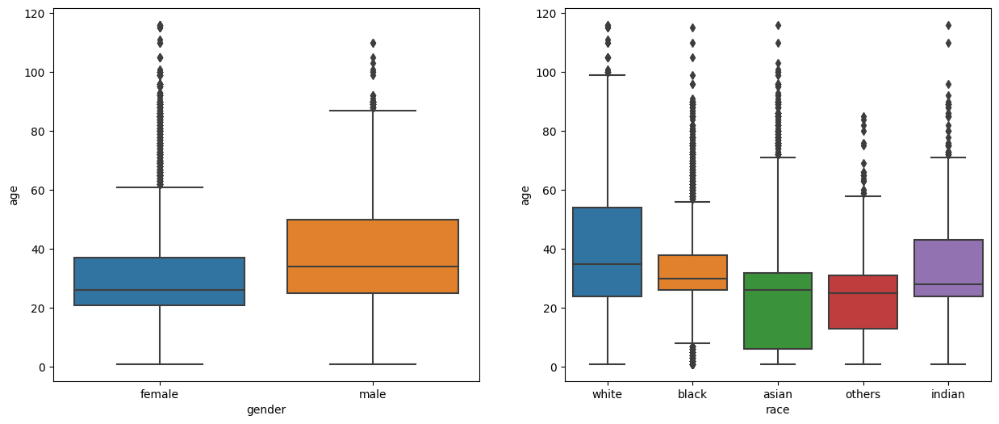

In [16]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
sns.boxplot(data=df_origin, x='gender', y='age', ax=ax1)
sns.boxplot(data=df_origin, x='race', y='age', ax=ax2)

<Axes: xlabel='gender', ylabel='age'>

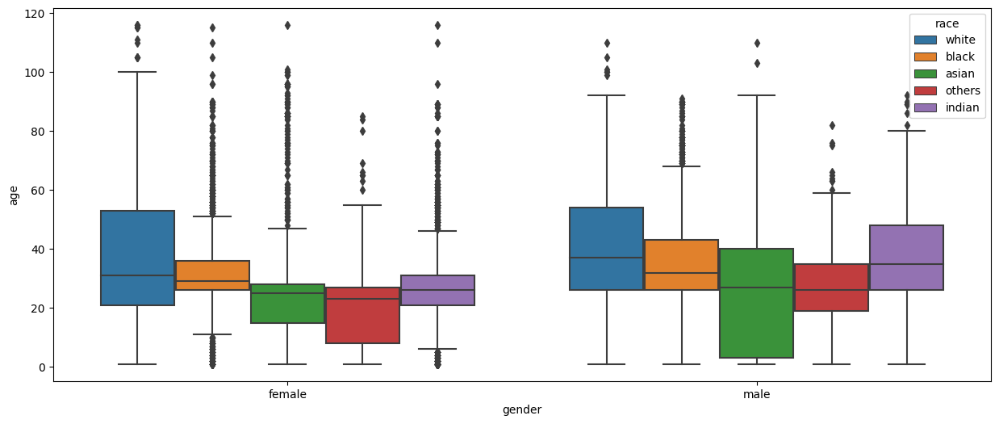

In [17]:

plt.figure(figsize=(15, 6))
sns.boxplot(data=df_origin, x='gender', y='age', hue='race')

<Axes: xlabel='race,gender'>

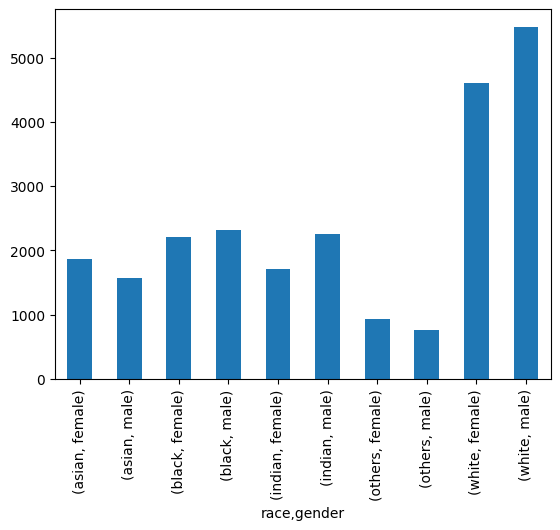

In [18]:
df_origin.groupby(by=['race', 'gender'])['age'].count().plot(kind='bar')

<Axes: >

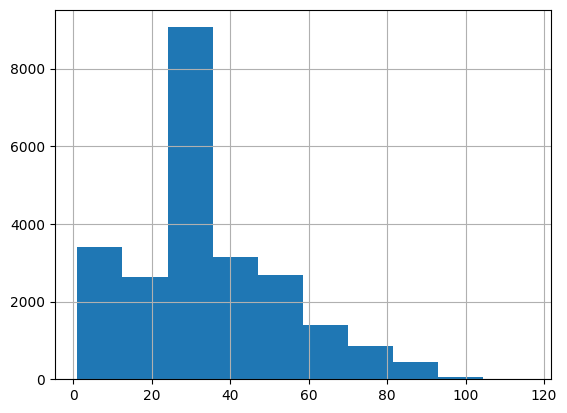

In [19]:
df_origin['age'].hist()

In [20]:
df_origin['age'].describe()

count    23705.000000
mean        33.300907
std         19.885708
min          1.000000
25%         23.000000
50%         29.000000
75%         45.000000
max        116.000000
Name: age, dtype: float64

In [21]:
df = df_origin.copy()
df = df[(df['age'] > 10) & (df['age'] < 65)]
df.describe()

,age
count,18529.000000
mean,33.939230
std,12.300058
min,11.000000
25%,26.000000
50%,30.000000
75%,41.000000
max,64.000000


In [22]:
df.head()

,age,gender,race,file
0,26.0,female,white,/content/UTKFace/26_1_0_20170116173105204.jpg....
1,26.0,female,black,/content/UTKFace/26_1_1_20170113003743101.jpg....
2,16.0,female,white,/content/UTKFace/16_1_0_20170109213440225.jpg....
3,60.0,female,white,/content/UTKFace/60_1_0_20170110140849306.jpg....
4,41.0,male,white,/content/UTKFace/41_0_0_20170116214404363.jpg....


## 数据预处理和生成器

In [23]:
import tensorflow as tf

In [24]:

p = np.random.permutation(len(df))
train_up_to = int(len(df) * TRAIN_TEST_SPLIT)
train_idx = p[:train_up_to]
test_idx = p[train_up_to:]

# split train_idx further into training and validation set
train_up_to = int(train_up_to * 0.7)
train_idx, valid_idx = train_idx[:train_up_to], train_idx[train_up_to:]

df['gender_id'] = df['gender'].map(lambda gender: GENDER_ID_MAP[gender])
df['race_id'] = df['race'].map(lambda race: RACE_ID_MAP[race])

max_age = df['age'].max()
print('train count: %s, valid count: %s, test count: %s, max age: %s' % (
    len(train_idx), len(valid_idx), len(test_idx), max_age))

train count: 9079, valid count: 3891, test count: 5559, max age: 64.0


In [25]:


def get_data_generator(df, indices, for_training, batch_size=16):
    images, ages, races, genders = [], [], [], []
    while True:
        for i in indices:
            r = df.iloc[i]
            file, age, race, gender = r['file'], r['age'], r['race_id'], r['gender_id']
            im = Image.open(file)
            im = im.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
            im = np.array(im) / 255.0
            images.append(im)
            ages.append(age / max_age)
            races.append(to_categorical(race, len(RACE_ID_MAP)))
            genders.append(to_categorical(gender, 2))
            if len(images) >= batch_size:
                yield np.array(images), [np.array(ages), np.array(races), np.array(genders)]
                images, ages, races, genders = [], [], [], []
        if not for_training:
            break

# 数据增强模块添加

In [26]:
img_path = '/content/UTKFace/100_0_0_20170112213500903.jpg.chip.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x_one = image.img_to_array(img)
x_one = np.expand_dims(x_one, axis=0)
x_one.shape

(1, 224, 224, 3)

In [27]:
data_augmentation = tf.keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH,3)),
    layers.RandomRotation(0.03),
    layers.RandomZoom(0.03),
    # layers.RandomBrightness(0.05)
    layers.GaussianNoise(0.8)
  ]
)

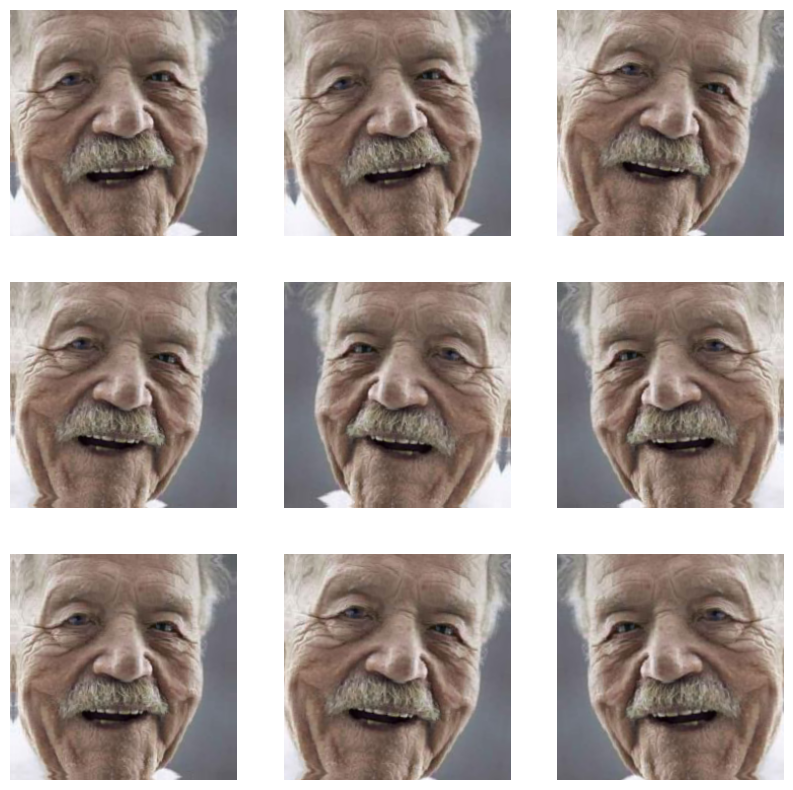

In [28]:
plt.figure(figsize=(10, 10))
# for images, _ in train_ds.take(1):
for i in range(9):
  augmented_images = data_augmentation(x_one)
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(augmented_images[0].numpy().astype("uint8"))
  plt.axis("off")

# 普通模型

## 模型构建

In [29]:


def conv_block(input_data, filters=32, bn=True, pool=True, kernel_size=3, activation='relu'):
    x = Conv2D(filters=filters, kernel_size=kernel_size, activation=activation)(input_data)
    if bn:
        x = BatchNormalization()(x)
    if pool:
        x = MaxPool2D()(x)
    return x

input_layer = Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS))
input_layer = data_augmentation(input_layer)
x = conv_block(input_layer, filters=32, bn=False, pool=False)
x = conv_block(x, filters=32*2)
x = conv_block(x, filters=32*3)
x = conv_block(x, filters=32*4)
x = conv_block(x, filters=32*5)
x = conv_block(x, filters=32*6)
bottleneck = GlobalMaxPool2D()(x)

# for age calculation
age_x = Dense(128, activation='relu')(bottleneck)
age_output = Dense(1, activation='sigmoid', name='age_output')(age_x)

# for race prediction
race_x = Dense(128, activation='relu')(bottleneck)
race_output = Dense(len(RACE_ID_MAP), activation='softmax', name='race_output')(race_x)

# for gender prediction
gender_x = Dense(128, activation='relu')(bottleneck)
gender_output = Dense(len(GENDER_ID_MAP), activation='softmax', name='gender_output')(gender_x)

model = Model(inputs=input_layer, outputs=[age_output, race_output, gender_output])
model.compile(optimizer='rmsprop', 
              loss={
                  'age_output': 'mse',
                  'race_output': 'categorical_crossentropy',
                  'gender_output': 'categorical_crossentropy'},
              loss_weights={
                  'age_output': 2.,
                  'race_output': 1.5,
                  'gender_output': 1.},
              metrics={
                  'age_output': 'mae',
                  'race_output': 'accuracy',
                  'gender_output': 'accuracy'})
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 222, 222, 32  896         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 220, 220, 64  18496       ['conv2d[1][0]']                 
                                )                                                             

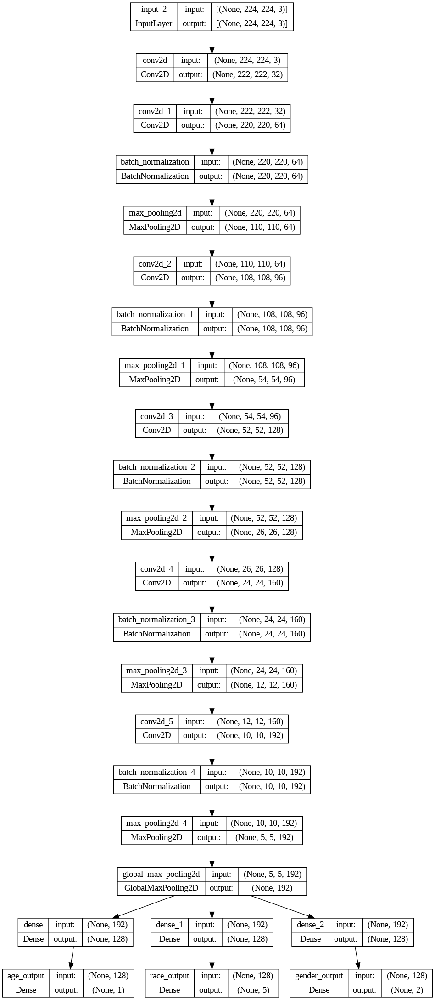

In [30]:
import tensorflow as tf
tf.keras.utils.plot_model(model,show_shapes=True)

## 模型训练

In [31]:


batch_size = 64
valid_batch_size = 64
train_gen = get_data_generator(df, train_idx, for_training=True, batch_size=batch_size)
valid_gen = get_data_generator(df, valid_idx, for_training=True, batch_size=valid_batch_size)

# callbacks = [
#     ModelCheckpoint("./model_checkpoint", monitor='val_loss')
# ]
save_model_path = '/content/save/checkpoint'
# model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
#     filepath=save_model_path,
#     save_weights_only=True,
#     monitor='val_loss',
#     mode='min',
#     save_best_only=True)

history = model.fit(train_gen,
                    steps_per_epoch=len(train_idx)//batch_size,
                    epochs=5,
                    # callbacks=model_checkpoint_callback,
                    validation_data=valid_gen,
                    validation_steps=len(valid_idx)//valid_batch_size)

Epoch 1/5
141/141 [==============================] - 84s 448ms/step - loss: 3.0142 - age_output_loss: 0.0731 - race_output_loss: 1.4283 - gender_output_loss: 0.7255 - age_output_mae: 0.2180 - race_output_accuracy: 0.4701 - gender_output_accuracy: 0.6717 - val_loss: 4.2906 - val_age_output_loss: 0.0433 - val_race_output_loss: 1.9455 - val_gender_output_loss: 1.2856 - val_age_output_mae: 0.1737 - val_race_output_accuracy: 0.4190 - val_gender_output_accuracy: 0.5211
Epoch 2/5
141/141 [==============================] - 68s 481ms/step - loss: 1.9710 - age_output_loss: 0.0449 - race_output_loss: 1.0104 - gender_output_loss: 0.3655 - age_output_mae: 0.1703 - race_output_accuracy: 0.6223 - gender_output_accuracy: 0.8387 - val_loss: 3.3165 - val_age_output_loss: 0.0372 - val_race_output_loss: 1.5274 - val_gender_output_loss: 0.9510 - val_age_output_mae: 0.1598 - val_race_output_accuracy: 0.4464 - val_gender_output_accuracy: 0.5354
Epoch 3/5
141/141 [==============================] - 65s 459ms/s

In [32]:

print('\n'.join(history.history.keys()))

loss
age_output_loss
race_output_loss
gender_output_loss
age_output_mae
race_output_accuracy
gender_output_accuracy
val_loss
val_age_output_loss
val_race_output_loss
val_gender_output_loss
val_age_output_mae
val_race_output_accuracy
val_gender_output_accuracy


In [33]:
history.history

{'loss': [3.0142340660095215,
  1.970991611480713,
  1.5765372514724731,
  1.3554840087890625,
  1.18996000289917],
 'age_output_loss': [0.07313196361064911,
  0.044892292469739914,
  0.03762268275022507,
  0.03410741686820984,
  0.03044826351106167],
 'race_output_loss': [1.4282896518707275,
  1.0104418992996216,
  0.8192699551582336,
  0.7054492235183716,
  0.6216681599617004],
 'gender_output_loss': [0.7255364656448364,
  0.3655448853969574,
  0.2723870277404785,
  0.229095920920372,
  0.19656141102313995],
 'age_output_mae': [0.21797630190849304,
  0.17034371197223663,
  0.1556585282087326,
  0.1477554738521576,
  0.13939329981803894],
 'race_output_accuracy': [0.47007977962493896,
  0.6223404407501221,
  0.708776593208313,
  0.7493351101875305,
  0.783687949180603],
 'gender_output_accuracy': [0.6716533899307251,
  0.838652491569519,
  0.8909574747085571,
  0.9140070676803589,
  0.9273049831390381],
 'val_loss': [4.290560245513916,
  3.3165197372436523,
  1.8992053270339966,
  1.6

### 训练过程可视化

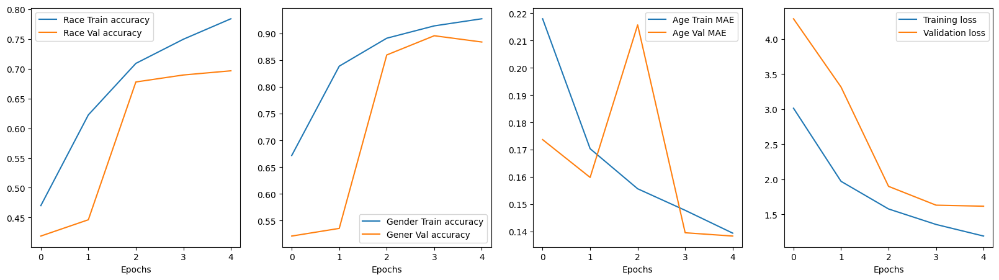

In [34]:
def  plot_train_history(history):
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].plot(history.history['race_output_accuracy'], label='Race Train accuracy')
    axes[0].plot(history.history['val_race_output_accuracy'], label='Race Val accuracy')
    axes[0].set_xlabel('Epochs')
    axes[0].legend()
    
    axes[1].plot(history.history['gender_output_accuracy'], label='Gender Train accuracy')
    axes[1].plot(history.history['val_gender_output_accuracy'], label='Gener Val accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].legend()

    axes[2].plot(history.history['age_output_mae'], label='Age Train MAE')
    axes[2].plot(history.history['val_age_output_mae'], label='Age Val MAE')
    axes[2].set_xlabel('Epochs')
    axes[2].legend()  

    axes[3].plot(history.history['loss'], label='Training loss')
    axes[3].plot(history.history['val_loss'], label='Validation loss')
    axes[3].set_xlabel('Epochs')
    axes[3].legend()

plot_train_history(history)

## 预测单张图片

In [35]:
model.evaluate(valid_gen, steps=len(test_idx)//128)

43/43 [==============================] - 11s 264ms/step - loss: 1.6279 - age_output_loss: 0.0324 - race_output_loss: 0.8461 - gender_output_loss: 0.2941 - age_output_mae: 0.1363 - race_output_accuracy: 0.6955 - gender_output_accuracy: 0.8812


[1.627936840057373,
 0.03239523619413376,
 0.8460586667060852,
 0.2940579652786255,
 0.1363084465265274,
 0.6954941749572754,
 0.8811773061752319]

## 模型预测

In [36]:
test_gen = get_data_generator(df, test_idx, for_training=False, batch_size=128)
dict(zip(model.metrics_names, model.evaluate(test_gen, steps=len(test_idx)//128)))

43/43 [==============================] - 26s 519ms/step - loss: 1.6254 - age_output_loss: 0.0329 - race_output_loss: 0.8476 - gender_output_loss: 0.2883 - age_output_mae: 0.1390 - race_output_accuracy: 0.7026 - gender_output_accuracy: 0.8879


{'loss': 1.6254217624664307,
 'age_output_loss': 0.03288012742996216,
 'race_output_loss': 0.8475506901741028,
 'gender_output_loss': 0.28833556175231934,
 'age_output_mae': 0.13902445137500763,
 'race_output_accuracy': 0.702579915523529,
 'gender_output_accuracy': 0.8878996968269348}

In [37]:

test_gen = get_data_generator(df, test_idx, for_training=False, batch_size=128)
x_test, (age_true, race_true, gender_true)= next(test_gen)
age_pred, race_pred, gender_pred = model.predict_on_batch(x_test)

race_pred, gender_pred = tf.math.argmax(race_pred, axis=1), tf.math.argmax(gender_pred, axis=1)
race_true, gender_true = tf.math.argmax(race_true, axis=1), tf.math.argmax(gender_true, axis=1)
age_true = age_true * max_age
age_pred = age_pred * max_age

In [38]:
age_pred

array([[28.834154],
       [39.48171 ],
       [31.289663],
       [25.81699 ],
       [43.77027 ],
       [18.4485  ],
       [27.086353],
       [23.632282],
       [36.019146],
       [26.241602],
       [25.745855],
       [26.578918],
       [29.056267],
       [35.949226],
       [23.017069],
       [34.850018],
       [31.598776],
       [26.66187 ],
       [25.360212],
       [30.548588],
       [23.915125],
       [34.773552],
       [27.34643 ],
       [33.98827 ],
       [34.082893],
       [32.134434],
       [29.239182],
       [25.538887],
       [34.67549 ],
       [21.651512],
       [25.829834],
       [26.306927],
       [26.679165],
       [32.953186],
       [16.5007  ],
       [35.317207],
       [20.236969],
       [33.535686],
       [34.606174],
       [26.822716],
       [32.484364],
       [31.377588],
       [42.846634],
       [31.236307],
       [29.26949 ],
       [38.121326],
       [24.454916],
       [25.504318],
       [30.692787],
       [33.074516],


## 结果显示

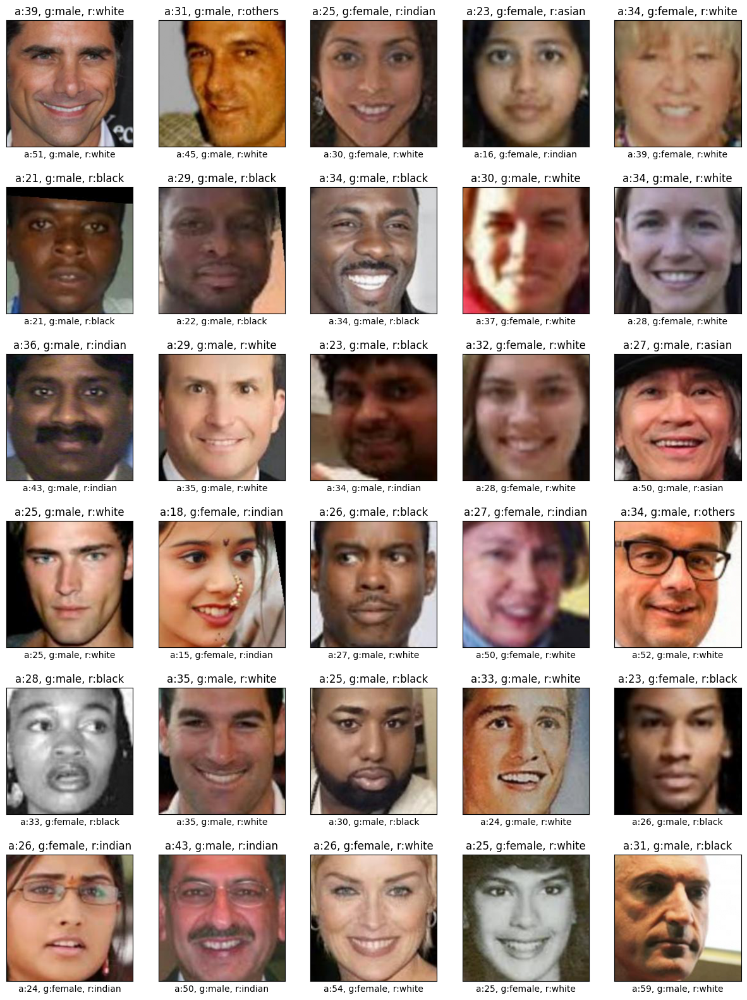

In [39]:

import math
import numpy
n = 30
random_indices = np.random.permutation(n)
n_cols = 5
n_rows = math.ceil(n / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))
for i, img_idx in enumerate(random_indices):
    ax = axes.flat[i]
    ax.imshow(x_test[img_idx])
    ax.set_title('a:{}, g:{}, r:{}'.format(
        int(age_pred[img_idx]),
        ID_GENDER_MAP[gender_pred[img_idx].numpy()],
        ID_RACE_MAP[race_pred[img_idx].numpy()]))
    ax.set_xlabel('a:{}, g:{}, r:{}'.format(
        int(age_true[img_idx]), ID_GENDER_MAP[gender_true[img_idx].numpy()], ID_RACE_MAP[race_true[img_idx].numpy()]))
    ax.set_xticks([])
    ax.set_yticks([])

## 使用classification_report 显示分类指标

In [40]:
from sklearn.metrics import classification_report
print("Classification report for race")
print(classification_report(race_true, race_pred, labels=list(ID_RACE_MAP.keys())))

print("\nClassification report for gender")
print(classification_report(gender_true, gender_pred, labels=list(ID_GENDER_MAP.keys())))

Classification report for race
              precision    recall  f1-score   support

           0       0.93      0.84      0.88        68
           1       0.80      1.00      0.89        24
           2       0.68      0.93      0.79        14
           3       0.64      0.50      0.56        18
           4       0.00      0.00      0.00         4

    accuracy                           0.80       128
   macro avg       0.61      0.65      0.62       128
weighted avg       0.81      0.80      0.80       128


Classification report for gender
              precision    recall  f1-score   support

           0       0.89      0.96      0.92        73
           1       0.94      0.84      0.88        55

    accuracy                           0.91       128
   macro avg       0.91      0.90      0.90       128
weighted avg       0.91      0.91      0.91       128



# resnet模型  迁移学习

## 模型构建

In [41]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
input_tensor = Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

# base_model = InceptionV3(input_tensor=input_tensor, weights='imagenet', include_top=False)

base_model = tf.keras.applications.ResNet50(input_tensor=input_tensor,
                        include_top=False,
                        weights='imagenet')

94765736/94765736 [==============================] - 1s 0us/step


In [42]:
# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# let's add a fully-connected layer
x = Dense(1024, activation='relu')(x)
# and a logistic layer -- let's say we have 200 feature
bottleneck = Dense(200)(x)

# for age calculation
age_x = Dense(128, activation='relu')(bottleneck)
age_output = Dense(1, activation='sigmoid', name='age_output')(age_x)

# for race prediction
race_x = Dense(128, activation='relu')(bottleneck)
race_output = Dense(len(RACE_ID_MAP), activation='softmax', name='race_output')(race_x)

# for gender prediction
gender_x = Dense(128, activation='relu')(bottleneck)
gender_output = Dense(len(GENDER_ID_MAP), activation='softmax', name='gender_output')(gender_x)

model_resnet50 = Model(inputs=input_tensor, outputs=[age_output, race_output, gender_output])
model_resnet50.compile(optimizer='rmsprop', 
              loss={
                  'age_output': 'mse',
                  'race_output': 'categorical_crossentropy',
                  'gender_output': 'categorical_crossentropy'},
              loss_weights={
                  'age_output': 2.,
                  'race_output': 1.5,
                  'gender_output': 1.},
              metrics={
                  'age_output': 'mae',
                  'race_output': 'accuracy',
                  'gender_output': 'accuracy'})


In [43]:
model_resnet50.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

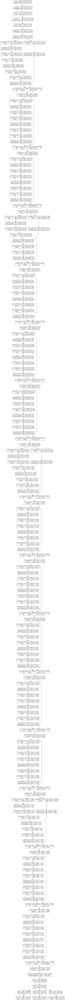

In [44]:
import tensorflow as tf
tf.keras.utils.plot_model(model_resnet50,show_shapes=True)

## 模型训练

In [45]:

from tensorflow.keras.callbacks import ModelCheckpoint

batch_size = 64
valid_batch_size = 64
train_gen = get_data_generator(df, train_idx, for_training=True, batch_size=batch_size)
valid_gen = get_data_generator(df, valid_idx, for_training=True, batch_size=valid_batch_size)
# save_model_path = "./model_checkpoint"

# callbacks = [
#     ModelCheckpoint(save_model_path, monitor='val_loss')
# ]
# save_model_inception_path = '/content/save_inception/checkpoint'
# model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
#     filepath=save_model_inception_path,
#     save_weights_only=True,
#     monitor='val_loss',
#     mode='min',
#     save_best_only=True)

history = model_resnet50.fit(train_gen,
                    steps_per_epoch=len(train_idx)//batch_size,
                    epochs=5,
                    # callbacks=model_checkpoint_callback,
                    validation_data=valid_gen,
                    validation_steps=len(valid_idx)//valid_batch_size)

Epoch 1/5
141/141 [==============================] - 151s 809ms/step - loss: 2.4877 - age_output_loss: 0.0370 - race_output_loss: 1.2241 - gender_output_loss: 0.5776 - age_output_mae: 0.1511 - race_output_accuracy: 0.5488 - gender_output_accuracy: 0.7584 - val_loss: 16.7418 - val_age_output_loss: 0.0460 - val_race_output_loss: 7.6515 - val_gender_output_loss: 5.1725 - val_age_output_mae: 0.1892 - val_race_output_accuracy: 0.4193 - val_gender_output_accuracy: 0.5211
Epoch 2/5
141/141 [==============================] - 110s 781ms/step - loss: 1.4272 - age_output_loss: 0.0297 - race_output_loss: 0.7509 - gender_output_loss: 0.2414 - age_output_mae: 0.1354 - race_output_accuracy: 0.7457 - gender_output_accuracy: 0.9069 - val_loss: 19.0230 - val_age_output_loss: 0.2215 - val_race_output_loss: 7.5473 - val_gender_output_loss: 7.2592 - val_age_output_mae: 0.4293 - val_race_output_accuracy: 0.1823 - val_gender_output_accuracy: 0.4786
Epoch 3/5
141/141 [==============================] - 110s 78

In [46]:

print('\n'.join(history.history.keys()))

loss
age_output_loss
race_output_loss
gender_output_loss
age_output_mae
race_output_accuracy
gender_output_accuracy
val_loss
val_age_output_loss
val_race_output_loss
val_gender_output_loss
val_age_output_mae
val_race_output_accuracy
val_gender_output_accuracy


In [47]:
history.history

{'loss': [2.4877450466156006,
  1.4272351264953613,
  1.1551830768585205,
  0.9462682008743286,
  0.7908140420913696],
 'age_output_loss': [0.03704386204481125,
  0.029749879613518715,
  0.02798820473253727,
  0.026336047798395157,
  0.024664204567670822],
 'race_output_loss': [1.2240647077560425,
  0.7509072422981262,
  0.6095675230026245,
  0.49532416462898254,
  0.4111030697822571],
 'gender_output_loss': [0.5775611996650696,
  0.24137447774410248,
  0.18485546112060547,
  0.1506103128194809,
  0.12483132630586624],
 'age_output_mae': [0.15113578736782074,
  0.13536889851093292,
  0.1302587389945984,
  0.1258225440979004,
  0.12136140465736389],
 'race_output_accuracy': [0.548758864402771,
  0.745678186416626,
  0.7957668304443359,
  0.8326684236526489,
  0.8546099066734314],
 'gender_output_accuracy': [0.7584219574928284,
  0.9069148898124695,
  0.9304078221321106,
  0.946919322013855,
  0.9545655846595764],
 'val_loss': [16.741840362548828,
  19.023048400878906,
  4.40465879440307

### 训练过程可视化

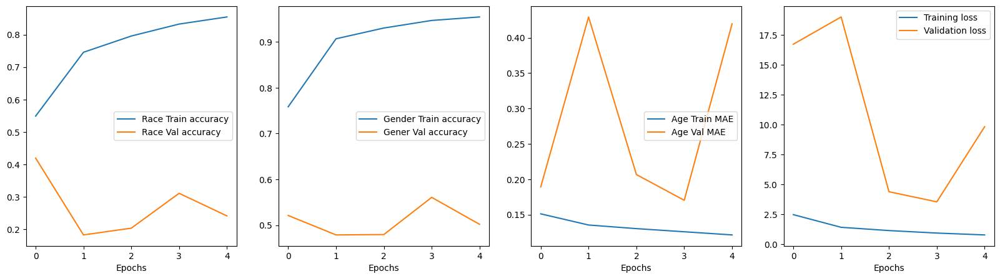

In [48]:
def  plot_train_history(history):
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].plot(history.history['race_output_accuracy'], label='Race Train accuracy')
    axes[0].plot(history.history['val_race_output_accuracy'], label='Race Val accuracy')
    axes[0].set_xlabel('Epochs')
    axes[0].legend()
    
    axes[1].plot(history.history['gender_output_accuracy'], label='Gender Train accuracy')
    axes[1].plot(history.history['val_gender_output_accuracy'], label='Gener Val accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].legend()

    axes[2].plot(history.history['age_output_mae'], label='Age Train MAE')
    axes[2].plot(history.history['val_age_output_mae'], label='Age Val MAE')
    axes[2].set_xlabel('Epochs')
    axes[2].legend()  

    axes[3].plot(history.history['loss'], label='Training loss')
    axes[3].plot(history.history['val_loss'], label='Validation loss')
    axes[3].set_xlabel('Epochs')
    axes[3].legend()

plot_train_history(history)

## 模型预测

In [49]:
test_gen = get_data_generator(df, test_idx, for_training=False, batch_size=128)
dict(zip(model.metrics_names, model_resnet50.evaluate(test_gen, steps=len(test_idx)//128)))

43/43 [==============================] - 30s 605ms/step - loss: 9.8810 - age_output_loss: 0.2137 - race_output_loss: 5.0933 - gender_output_loss: 1.8137 - age_output_mae: 0.4175 - race_output_accuracy: 0.2313 - gender_output_accuracy: 0.4985


{'loss': 9.880998611450195,
 'age_output_loss': 0.21366474032402039,
 'race_output_loss': 5.093337535858154,
 'gender_output_loss': 1.8136646747589111,
 'age_output_mae': 0.4174572825431824,
 'race_output_accuracy': 0.23128633201122284,
 'gender_output_accuracy': 0.4985465109348297}

In [50]:

test_gen = get_data_generator(df, test_idx, for_training=False, batch_size=128)
x_test, (age_true, race_true, gender_true)= next(test_gen)
age_pred, race_pred, gender_pred = model_resnet50.predict_on_batch(x_test)

race_pred, gender_pred = tf.math.argmax(race_pred, axis=1), tf.math.argmax(gender_pred, axis=1)
race_true, gender_true = tf.math.argmax(race_true, axis=1), tf.math.argmax(gender_true, axis=1)
age_true = age_true * max_age
age_pred = age_pred * max_age

## 结果显示

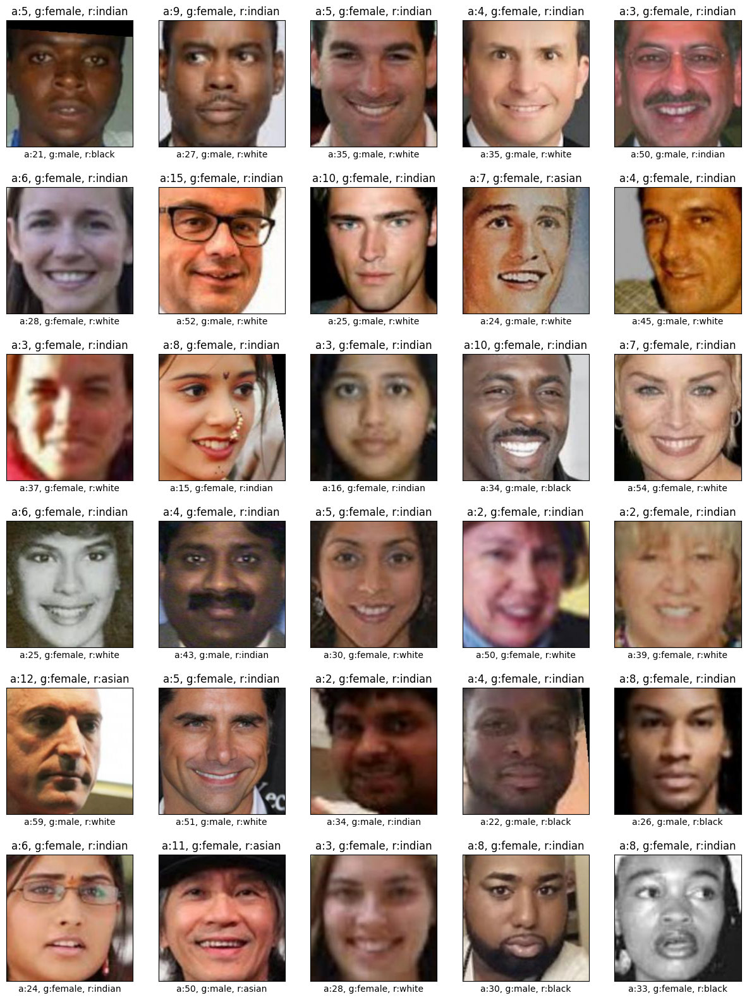

In [51]:

import math
import numpy
n = 30
random_indices = np.random.permutation(n)
n_cols = 5
n_rows = math.ceil(n / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))
for i, img_idx in enumerate(random_indices):
    ax = axes.flat[i]
    ax.imshow(x_test[img_idx])
    ax.set_title('a:{}, g:{}, r:{}'.format(
        int(age_pred[img_idx]),
        ID_GENDER_MAP[gender_pred[img_idx].numpy()],
        ID_RACE_MAP[race_pred[img_idx].numpy()]))
    ax.set_xlabel('a:{}, g:{}, r:{}'.format(
        int(age_true[img_idx]), ID_GENDER_MAP[gender_true[img_idx].numpy()], ID_RACE_MAP[race_true[img_idx].numpy()]))
    ax.set_xticks([])
    ax.set_yticks([])

## 使用classification_report 显示分类指标

In [52]:
from sklearn.metrics import classification_report
print("Classification report for race")
print(classification_report(race_true, race_pred, labels=list(ID_RACE_MAP.keys())))

print("\nClassification report for gender")
print(classification_report(gender_true, gender_pred, labels=list(ID_GENDER_MAP.keys())))

Classification report for race
              precision    recall  f1-score   support

           0       1.00      0.03      0.06        68
           1       0.00      0.00      0.00        24
           2       0.35      0.43      0.39        14
           3       0.16      0.94      0.27        18
           4       0.00      0.00      0.00         4

    accuracy                           0.20       128
   macro avg       0.30      0.28      0.14       128
weighted avg       0.59      0.20      0.11       128


Classification report for gender
              precision    recall  f1-score   support

           0       1.00      0.05      0.10        73
           1       0.44      1.00      0.61        55

    accuracy                           0.46       128
   macro avg       0.72      0.53      0.36       128
weighted avg       0.76      0.46      0.32       128



/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## 预测单张图片

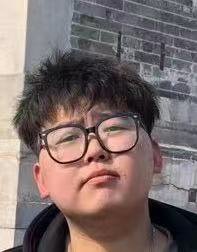

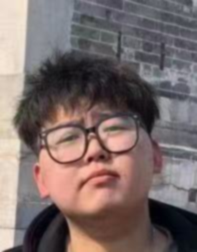

1/1 [==============================] - 0s 25ms/step


(array([[0.38707376]], dtype=float32),
 array([[0.41218978, 0.22776656, 0.08799683, 0.22459617, 0.04745071]],
       dtype=float32),
 array([[0.76440084, 0.23559913]], dtype=float32))

In [111]:
file_path = '/content/cd6c410dcad836029ce5eb556d7de5b.jpg'
im = Image.open(file_path)
im.show()
im = im.filter(ImageFilter.GaussianBlur(radius=1))
im.show()
im = im.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
im = np.array(im) / 255.0
im = np.expand_dims(im, axis=0)

age_pred, race_pred, gender_pred = model_resnet50.predict(im)
age_pred, race_pred, gender_pred

In [112]:
race_pred, gender_pred = tf.math.argmax(race_pred, axis=1), tf.math.argmax(gender_pred, axis=1)
age_pred = age_pred * max_age

race_pred, gender_pred, age_pred

(<tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>,
 <tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>,
 array([[24.77272]], dtype=float32))

# Inception模型  迁移学习

## 模型构建

In [55]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
input_tensor = Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

base_model = InceptionV3(input_tensor=input_tensor, weights='imagenet', include_top=False)

87910968/87910968 [==============================] - 0s 0us/step


In [56]:
# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# let's add a fully-connected layer
x = Dense(1024, activation='relu')(x)
# and a logistic layer -- let's say we have 200 feature
bottleneck = Dense(200)(x)

# for age calculation
age_x = Dense(128, activation='relu')(bottleneck)
age_output = Dense(1, activation='sigmoid', name='age_output')(age_x)

# for race prediction
race_x = Dense(128, activation='relu')(bottleneck)
race_output = Dense(len(RACE_ID_MAP), activation='softmax', name='race_output')(race_x)

# for gender prediction
gender_x = Dense(128, activation='relu')(bottleneck)
gender_output = Dense(len(GENDER_ID_MAP), activation='softmax', name='gender_output')(gender_x)

model_inception = Model(inputs=input_tensor, outputs=[age_output, race_output, gender_output])
model_inception.compile(optimizer='rmsprop', 
              loss={
                  'age_output': 'mse',
                  'race_output': 'categorical_crossentropy',
                  'gender_output': 'categorical_crossentropy'},
              loss_weights={
                  'age_output': 2.,
                  'race_output': 1.5,
                  'gender_output': 1.},
              metrics={
                  'age_output': 'mae',
                  'race_output': 'accuracy',
                  'gender_output': 'accuracy'})


In [57]:
model_inception.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 111, 111, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_5 (BatchNo  (None, 111, 111, 32  96         ['conv2d_6[0][0]']               
 rmalization)                   )                                                           

In [58]:
import tensorflow as tf
tf.keras.utils.plot_model(model_inception,show_shapes=True)

## 模型训练

In [59]:

from tensorflow.keras.callbacks import ModelCheckpoint

batch_size = 64
valid_batch_size = 64
train_gen = get_data_generator(df, train_idx, for_training=True, batch_size=batch_size)
valid_gen = get_data_generator(df, valid_idx, for_training=True, batch_size=valid_batch_size)
# save_model_path = "./model_checkpoint"

# callbacks = [
#     ModelCheckpoint(save_model_path, monitor='val_loss')
# ]
save_model_inception_path = '/content/save_inception/checkpoint'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=save_model_inception_path,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

history = model_inception.fit(train_gen,
                    steps_per_epoch=len(train_idx)//batch_size,
                    epochs=5,
                    callbacks=model_checkpoint_callback,
                    validation_data=valid_gen,
                    validation_steps=len(valid_idx)//valid_batch_size)

Epoch 1/5
141/141 [==============================] - 130s 639ms/step - loss: 2.5992 - age_output_loss: 0.0374 - race_output_loss: 1.2881 - gender_output_loss: 0.5923 - age_output_mae: 0.1533 - race_output_accuracy: 0.5224 - gender_output_accuracy: 0.7133 - val_loss: 4.3257 - val_age_output_loss: 0.0411 - val_race_output_loss: 2.2815 - val_gender_output_loss: 0.8212 - val_age_output_mae: 0.1573 - val_race_output_accuracy: 0.4716 - val_gender_output_accuracy: 0.6263
Epoch 2/5
141/141 [==============================] - 87s 617ms/step - loss: 1.4641 - age_output_loss: 0.0325 - race_output_loss: 0.7600 - gender_output_loss: 0.2591 - age_output_mae: 0.1433 - race_output_accuracy: 0.7490 - gender_output_accuracy: 0.8992 - val_loss: 2.3415 - val_age_output_loss: 0.0341 - val_race_output_loss: 1.2700 - val_gender_output_loss: 0.3684 - val_age_output_mae: 0.1425 - val_race_output_accuracy: 0.7185 - val_gender_output_accuracy: 0.8776
Epoch 3/5
141/141 [==============================] - 86s 612ms/

In [60]:

print('\n'.join(history.history.keys()))

loss
age_output_loss
race_output_loss
gender_output_loss
age_output_mae
race_output_accuracy
gender_output_accuracy
val_loss
val_age_output_loss
val_race_output_loss
val_gender_output_loss
val_age_output_mae
val_race_output_accuracy
val_gender_output_accuracy


In [61]:
history.history

{'loss': [2.5992343425750732,
  1.4641082286834717,
  1.143022060394287,
  0.9373066425323486,
  0.7974507808685303],
 'age_output_loss': [0.037406086921691895,
  0.03251029923558235,
  0.03162869065999985,
  0.031142810359597206,
  0.03064998984336853],
 'race_output_loss': [1.2880853414535522,
  0.7599628567695618,
  0.5995082259178162,
  0.490803062915802,
  0.41471707820892334],
 'gender_output_loss': [0.5922942757606506,
  0.2591436505317688,
  0.1805025339126587,
  0.1388162076473236,
  0.1140754222869873],
 'age_output_mae': [0.15332438051700592,
  0.1432729810476303,
  0.14087465405464172,
  0.13933165371418,
  0.13813765347003937],
 'race_output_accuracy': [0.522384762763977,
  0.7490026354789734,
  0.8041888475418091,
  0.8383200168609619,
  0.8622562289237976],
 'gender_output_accuracy': [0.7133200168609619,
  0.8991578221321106,
  0.9375,
  0.953679084777832,
  0.9611037373542786],
 'val_loss': [4.325684070587158,
  2.341460943222046,
  1.5808483362197876,
  3.3641815185546

### 训练过程可视化

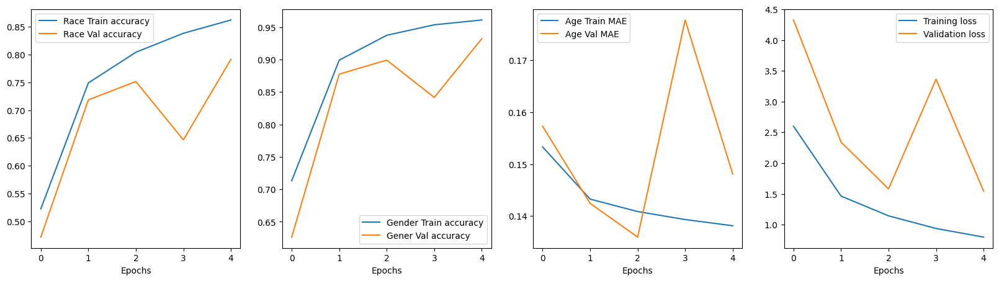

In [62]:
def  plot_train_history(history):
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].plot(history.history['race_output_accuracy'], label='Race Train accuracy')
    axes[0].plot(history.history['val_race_output_accuracy'], label='Race Val accuracy')
    axes[0].set_xlabel('Epochs')
    axes[0].legend()
    
    axes[1].plot(history.history['gender_output_accuracy'], label='Gender Train accuracy')
    axes[1].plot(history.history['val_gender_output_accuracy'], label='Gener Val accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].legend()

    axes[2].plot(history.history['age_output_mae'], label='Age Train MAE')
    axes[2].plot(history.history['val_age_output_mae'], label='Age Val MAE')
    axes[2].set_xlabel('Epochs')
    axes[2].legend()  

    axes[3].plot(history.history['loss'], label='Training loss')
    axes[3].plot(history.history['val_loss'], label='Validation loss')
    axes[3].set_xlabel('Epochs')
    axes[3].legend()

plot_train_history(history)

## 加载最佳模型权重

In [63]:
model_inception.load_weights(save_model_inception_path)

## 模型预测

In [64]:
test_gen = get_data_generator(df, test_idx, for_training=False, batch_size=128)
dict(zip(model.metrics_names, model_inception.evaluate(test_gen, steps=len(test_idx)//128)))

43/43 [==============================] - 29s 585ms/step - loss: 1.6814 - age_output_loss: 0.0372 - race_output_loss: 0.9218 - gender_output_loss: 0.2243 - age_output_mae: 0.1519 - race_output_accuracy: 0.7634 - gender_output_accuracy: 0.9400


{'loss': 1.6813533306121826,
 'age_output_loss': 0.03721268102526665,
 'race_output_loss': 0.9217693209648132,
 'gender_output_loss': 0.22427412867546082,
 'age_output_mae': 0.15191279351711273,
 'race_output_accuracy': 0.7634447813034058,
 'gender_output_accuracy': 0.9400436282157898}

In [65]:

test_gen = get_data_generator(df, test_idx, for_training=False, batch_size=128)
x_test, (age_true, race_true, gender_true)= next(test_gen)
age_pred, race_pred, gender_pred = model_inception.predict_on_batch(x_test)

race_pred, gender_pred = tf.math.argmax(race_pred, axis=1), tf.math.argmax(gender_pred, axis=1)
race_true, gender_true = tf.math.argmax(race_true, axis=1), tf.math.argmax(gender_true, axis=1)
age_true = age_true * max_age
age_pred = age_pred * max_age

## 结果显示

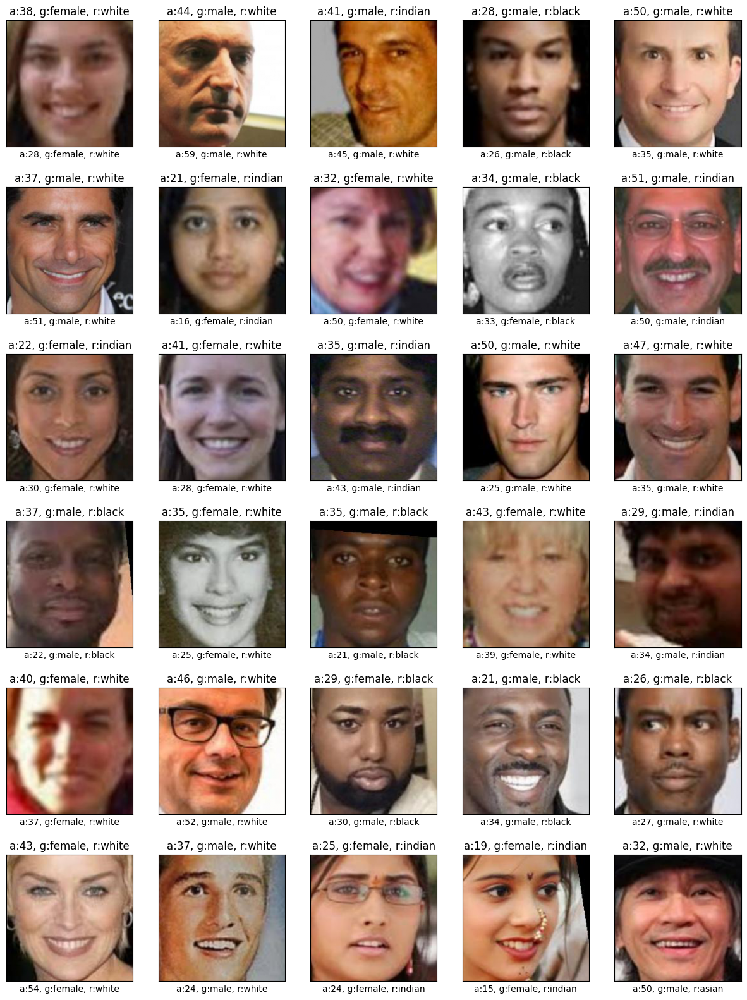

In [66]:

import math
import numpy
n = 30
random_indices = np.random.permutation(n)
n_cols = 5
n_rows = math.ceil(n / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))
for i, img_idx in enumerate(random_indices):
    ax = axes.flat[i]
    ax.imshow(x_test[img_idx])
    ax.set_title('a:{}, g:{}, r:{}'.format(
        int(age_pred[img_idx]),
        ID_GENDER_MAP[gender_pred[img_idx].numpy()],
        ID_RACE_MAP[race_pred[img_idx].numpy()]))
    ax.set_xlabel('a:{}, g:{}, r:{}'.format(
        int(age_true[img_idx]), ID_GENDER_MAP[gender_true[img_idx].numpy()], ID_RACE_MAP[race_true[img_idx].numpy()]))
    ax.set_xticks([])
    ax.set_yticks([])

## 使用classification_report 显示分类指标

In [67]:
from sklearn.metrics import classification_report
print("Classification report for race")
print(classification_report(race_true, race_pred, labels=list(ID_RACE_MAP.keys())))

print("\nClassification report for gender")
print(classification_report(gender_true, gender_pred, labels=list(ID_GENDER_MAP.keys())))

Classification report for race
              precision    recall  f1-score   support

           0       0.86      0.91      0.89        68
           1       0.90      0.75      0.82        24
           2       1.00      0.79      0.88        14
           3       0.71      0.94      0.81        18
           4       0.00      0.00      0.00         4

    accuracy                           0.84       128
   macro avg       0.69      0.68      0.68       128
weighted avg       0.84      0.84      0.83       128


Classification report for gender
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        73
           1       0.95      0.95      0.95        55

    accuracy                           0.95       128
   macro avg       0.95      0.95      0.95       128
weighted avg       0.95      0.95      0.95       128



## 预测单张图片

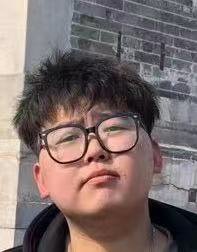

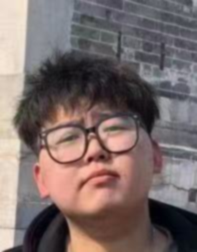

1/1 [==============================] - 0s 28ms/step


(array([[0.6879904]], dtype=float32),
 array([[0.91986686, 0.04956602, 0.00212741, 0.0175645 , 0.01087524]],
       dtype=float32),
 array([[0.99440503, 0.00559497]], dtype=float32))

In [113]:
file_path = '/content/cd6c410dcad836029ce5eb556d7de5b.jpg'
im = Image.open(file_path)
im.show()
im = im.filter(ImageFilter.GaussianBlur(radius=1))
im.show()
im = im.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
im = np.array(im) / 255.0
im = np.expand_dims(im, axis=0)

age_pred, race_pred, gender_pred = model_inception.predict(im)
age_pred, race_pred, gender_pred

In [114]:
race_pred, gender_pred = tf.math.argmax(race_pred, axis=1), tf.math.argmax(gender_pred, axis=1)
age_pred = age_pred * max_age

race_pred, gender_pred, age_pred

(<tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>,
 <tf.Tensor: shape=(1,), dtype=int64, numpy=array([0])>,
 array([[44.031387]], dtype=float32))

# 创新模型  resnet50 + efficienet迁移学习 数据增强

## 模型构建

In [70]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
# input_tensor = Input(shape=(198, 198, 3))
input_tensor = Input(shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

# base_model = InceptionV3(input_tensor=input_tensor, weights='imagenet', include_top=False)

# base_model = tf.keras.applications.ResNet50(input_tensor=input_tensor,
#                         include_top=False,
#                         weights='imagenet')

In [71]:
IMG_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, 3)
def create_EfficientNetB0_base():
  base_model = tf.keras.applications.EfficientNetB0(input_shape=IMG_SHAPE,
                          include_top=False,
                          weights='imagenet')
  inputs = tf.keras.Input(shape=IMG_SHAPE)
  x = base_model(inputs, training=True)
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  x = tf.keras.layers.Dropout(0.2)(x)
  outputs = tf.keras.layers.Dense(100)(x)
  EfficientNetB0_base = tf.keras.Model(inputs, outputs,name='EfficientNetB0')
  return EfficientNetB0_base

def create_ResNet50_base():
  base_model = tf.keras.applications.ResNet50(input_shape=IMG_SHAPE,
                          include_top=False,
                          weights='imagenet')
  inputs = tf.keras.Input(shape=IMG_SHAPE)
  x = base_model(inputs, training=True)
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  x = tf.keras.layers.Dropout(0.2)(x)
  outputs = tf.keras.layers.Dense(100)(x)
  ResNet50_base = tf.keras.Model(inputs, outputs,name='ResNet50')
  return ResNet50_base
ResNet50_base = create_ResNet50_base()
EfficientNetB0_base = create_EfficientNetB0_base()


16705208/16705208 [==============================] - 0s 0us/step


In [72]:
# inputs_ori = tf.keras.Input(shape=IMG_SHAPE)

resnet50_feature = ResNet50_base(input_tensor)
efficientnetB0_feature = EfficientNetB0_base(input_tensor)

mid_feature = tf.keras.layers.concatenate([resnet50_feature, efficientnetB0_feature])
# mid_feature = tf.keras.layers.Dense(200)(mid_feature)
output_final = tf.keras.layers.Dense(200)(mid_feature)

base_model_big = tf.keras.Model(input_tensor, output_final)

In [73]:
# add a global spatial average pooling layer
x = base_model_big.output
# x = GlobalAveragePooling2D()(x)
# let's add a fully-connected layer
# x = Dense(1024, activation='relu')(x)
# and a logistic layer -- let's say we have 200 feature
bottleneck = Dense(100)(x)

# for age calculation
age_x = Dense(128, activation='relu')(bottleneck)
age_output = Dense(1, activation='sigmoid', name='age_output')(age_x)

# for race prediction
race_x = Dense(128, activation='relu')(bottleneck)
race_output = Dense(len(RACE_ID_MAP), activation='softmax', name='race_output')(race_x)

# for gender prediction
gender_x = Dense(128, activation='relu')(bottleneck)
gender_output = Dense(len(GENDER_ID_MAP), activation='softmax', name='gender_output')(gender_x)

model_big = Model(inputs=input_tensor, outputs=[age_output, race_output, gender_output])
model_big.compile(optimizer='rmsprop', 
              loss={
                  'age_output': 'mse',
                  'race_output': 'categorical_crossentropy',
                  'gender_output': 'categorical_crossentropy'},
              loss_weights={
                  'age_output': 2.,
                  'race_output': 1.5,
                  'gender_output': 1.},
              metrics={
                  'age_output': 'mae',
                  'race_output': 'accuracy',
                  'gender_output': 'accuracy'})


In [74]:
model_big.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 ResNet50 (Functional)          (None, 100)          23792612    ['input_5[0][0]']                
                                                                                                  
 EfficientNetB0 (Functional)    (None, 100)          4177671     ['input_5[0][0]']                
                                                                                                  
 concatenate_2 (Concatenate)    (None, 200)          0           ['ResNet50[0][0]',         

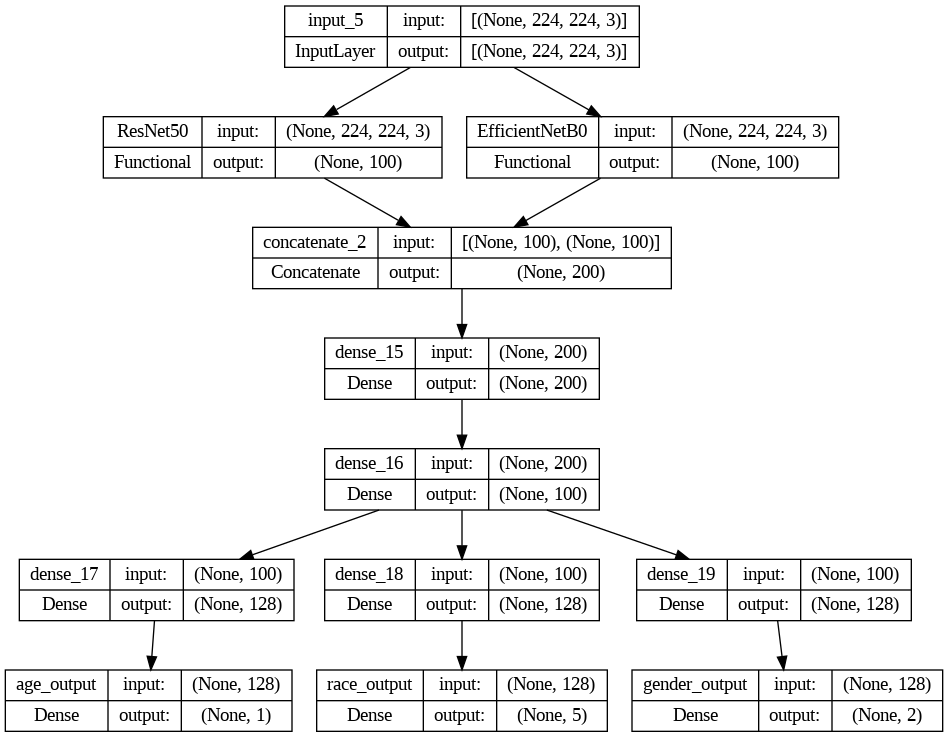

In [75]:
import tensorflow as tf
tf.keras.utils.plot_model(model_big,show_shapes=True)

## 模型训练

In [76]:

from tensorflow.keras.callbacks import ModelCheckpoint

batch_size = 64
valid_batch_size = 64
train_gen = get_data_generator(df, train_idx, for_training=True, batch_size=batch_size)
valid_gen = get_data_generator(df, valid_idx, for_training=True, batch_size=valid_batch_size)
# save_model_path = "./model_checkpoint"

# callbacks = [
#     ModelCheckpoint(save_model_path, monitor='val_loss')
# ]
# save_model_inception_path = '/content/save_inception/checkpoint'
# model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
#     filepath=save_model_inception_path,
#     save_weights_only=True,
#     monitor='val_loss',
#     mode='min',
#     save_best_only=True)

history = model_big.fit(train_gen,
                    steps_per_epoch=len(train_idx)//batch_size,
                    epochs=5,
                    # callbacks=model_checkpoint_callback,
                    validation_data=valid_gen,
                    validation_steps=len(valid_idx)//valid_batch_size)

Epoch 1/5
141/141 [==============================] - 288s 2s/step - loss: 1.9474 - age_output_loss: 0.0356 - race_output_loss: 0.9847 - gender_output_loss: 0.3992 - age_output_mae: 0.1457 - race_output_accuracy: 0.6674 - gender_output_accuracy: 0.8624 - val_loss: 1.2379 - val_age_output_loss: 0.0318 - val_race_output_loss: 0.6550 - val_gender_output_loss: 0.1920 - val_age_output_mae: 0.1383 - val_race_output_accuracy: 0.7810 - val_gender_output_accuracy: 0.9279
Epoch 2/5
141/141 [==============================] - 200s 1s/step - loss: 1.1322 - age_output_loss: 0.0254 - race_output_loss: 0.5961 - gender_output_loss: 0.1874 - age_output_mae: 0.1229 - race_output_accuracy: 0.8022 - gender_output_accuracy: 0.9327 - val_loss: 1.1705 - val_age_output_loss: 0.0222 - val_race_output_loss: 0.6350 - val_gender_output_loss: 0.1736 - val_age_output_mae: 0.1137 - val_race_output_accuracy: 0.7964 - val_gender_output_accuracy: 0.9372
Epoch 3/5
141/141 [==============================] - 200s 1s/step - 

In [77]:

print('\n'.join(history.history.keys()))

loss
age_output_loss
race_output_loss
gender_output_loss
age_output_mae
race_output_accuracy
gender_output_accuracy
val_loss
val_age_output_loss
val_race_output_loss
val_gender_output_loss
val_age_output_mae
val_race_output_accuracy
val_gender_output_accuracy


In [78]:
history.history

{'loss': [1.947427749633789,
  1.1322336196899414,
  0.8548582196235657,
  0.6830319762229919,
  0.5525521636009216],
 'age_output_loss': [0.035609304904937744,
  0.025354694575071335,
  0.022087516263127327,
  0.02027321420609951,
  0.01982940174639225],
 'race_output_loss': [0.9846529960632324,
  0.5961028337478638,
  0.4502720236778259,
  0.35729745030403137,
  0.2837468385696411],
 'gender_output_loss': [0.3992297053337097,
  0.18736982345581055,
  0.13527511060237885,
  0.10653936862945557,
  0.0872730240225792],
 'age_output_mae': [0.145696222782135,
  0.12291168421506882,
  0.11488781869411469,
  0.11003246158361435,
  0.1087847352027893],
 'race_output_accuracy': [0.6674423813819885,
  0.8021941781044006,
  0.843195915222168,
  0.8753324747085571,
  0.8989361524581909],
 'gender_output_accuracy': [0.8623670339584351,
  0.9327349066734314,
  0.9546763896942139,
  0.9611037373542786,
  0.9712987542152405],
 'val_loss': [1.2379223108291626,
  1.1705098152160645,
  1.16130244731903

### 训练过程可视化

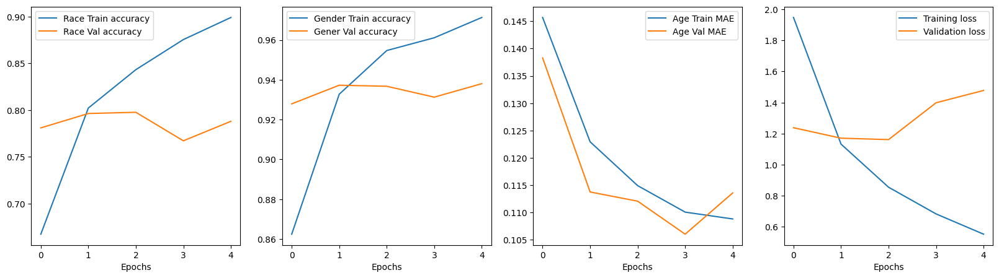

In [79]:
def  plot_train_history(history):
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].plot(history.history['race_output_accuracy'], label='Race Train accuracy')
    axes[0].plot(history.history['val_race_output_accuracy'], label='Race Val accuracy')
    axes[0].set_xlabel('Epochs')
    axes[0].legend()
    
    axes[1].plot(history.history['gender_output_accuracy'], label='Gender Train accuracy')
    axes[1].plot(history.history['val_gender_output_accuracy'], label='Gener Val accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].legend()

    axes[2].plot(history.history['age_output_mae'], label='Age Train MAE')
    axes[2].plot(history.history['val_age_output_mae'], label='Age Val MAE')
    axes[2].set_xlabel('Epochs')
    axes[2].legend()  

    axes[3].plot(history.history['loss'], label='Training loss')
    axes[3].plot(history.history['val_loss'], label='Validation loss')
    axes[3].set_xlabel('Epochs')
    axes[3].legend()

plot_train_history(history)

## 模型预测

In [80]:
test_gen = get_data_generator(df, test_idx, for_training=False, batch_size=128)
dict(zip(model.metrics_names, model_big.evaluate(test_gen, steps=len(test_idx)//128)))

43/43 [==============================] - 38s 881ms/step - loss: 1.5755 - age_output_loss: 0.0239 - race_output_loss: 0.8766 - gender_output_loss: 0.2128 - age_output_mae: 0.1165 - race_output_accuracy: 0.7696 - gender_output_accuracy: 0.9360


{'loss': 1.575548529624939,
 'age_output_loss': 0.023922044783830643,
 'race_output_loss': 0.8765787482261658,
 'gender_output_loss': 0.2128366380929947,
 'age_output_mae': 0.1164935827255249,
 'race_output_accuracy': 0.7696220874786377,
 'gender_output_accuracy': 0.9360465407371521}

In [81]:

test_gen = get_data_generator(df, test_idx, for_training=False, batch_size=128)
x_test, (age_true, race_true, gender_true)= next(test_gen)
age_pred, race_pred, gender_pred = model_big.predict_on_batch(x_test)

race_pred, gender_pred = tf.math.argmax(race_pred, axis=1), tf.math.argmax(gender_pred, axis=1)
race_true, gender_true = tf.math.argmax(race_true, axis=1), tf.math.argmax(gender_true, axis=1)
age_true = age_true * max_age
age_pred = age_pred * max_age

## 结果显示

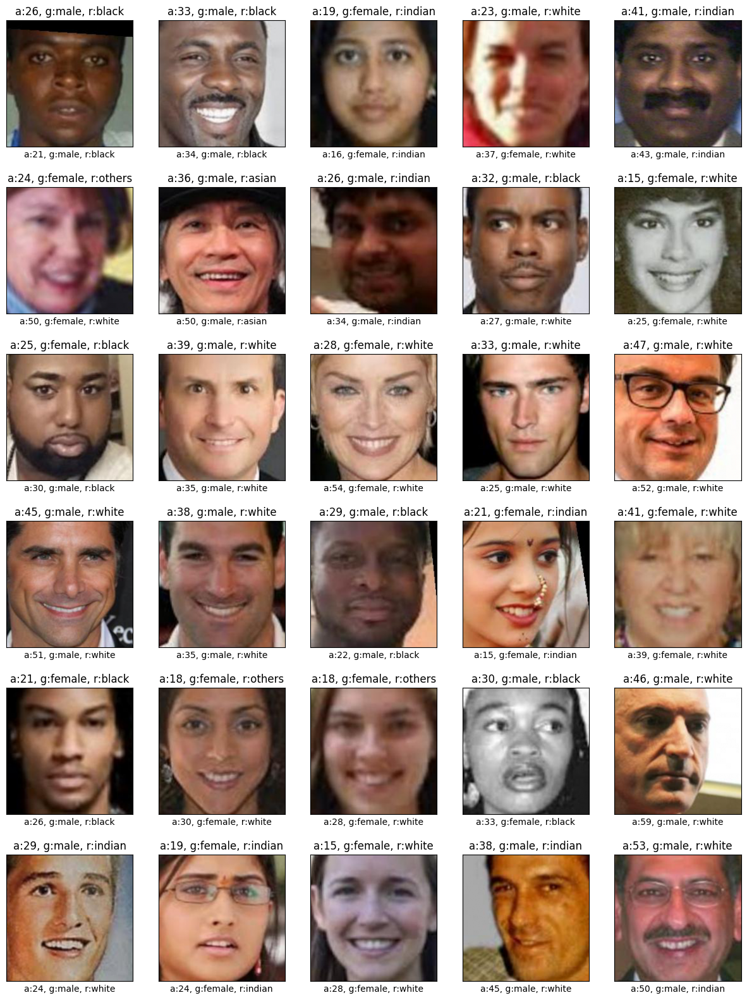

In [82]:

import math
import numpy
n = 30
random_indices = np.random.permutation(n)
n_cols = 5
n_rows = math.ceil(n / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))
for i, img_idx in enumerate(random_indices):
    ax = axes.flat[i]
    ax.imshow(x_test[img_idx])
    ax.set_title('a:{}, g:{}, r:{}'.format(
        int(age_pred[img_idx]),
        ID_GENDER_MAP[gender_pred[img_idx].numpy()],
        ID_RACE_MAP[race_pred[img_idx].numpy()]))
    ax.set_xlabel('a:{}, g:{}, r:{}'.format(
        int(age_true[img_idx]), ID_GENDER_MAP[gender_true[img_idx].numpy()], ID_RACE_MAP[race_true[img_idx].numpy()]))
    ax.set_xticks([])
    ax.set_yticks([])

## 使用classification_report 显示分类指标

In [83]:
from sklearn.metrics import classification_report
print("Classification report for race")
print(classification_report(race_true, race_pred, labels=list(ID_RACE_MAP.keys())))

print("\nClassification report for gender")
print(classification_report(gender_true, gender_pred, labels=list(ID_GENDER_MAP.keys())))

Classification report for race
              precision    recall  f1-score   support

           0       0.93      0.78      0.85        68
           1       0.87      0.83      0.85        24
           2       0.76      0.93      0.84        14
           3       0.72      0.72      0.72        18
           4       0.08      0.25      0.12         4

    accuracy                           0.78       128
   macro avg       0.67      0.70      0.68       128
weighted avg       0.84      0.78      0.81       128


Classification report for gender
              precision    recall  f1-score   support

           0       0.97      0.89      0.93        73
           1       0.87      0.96      0.91        55

    accuracy                           0.92       128
   macro avg       0.92      0.93      0.92       128
weighted avg       0.93      0.92      0.92       128



## 预测单张图片

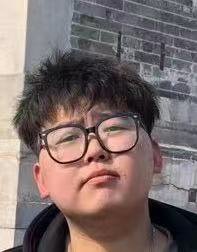

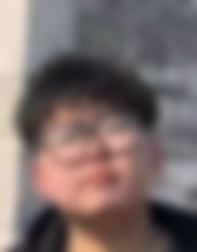

1/1 [==============================] - 0s 65ms/step


(array([[0.04124081]], dtype=float32),
 array([[2.3268771e-05, 1.3704800e-06, 2.1563748e-02, 9.7835416e-01,
         5.7480633e-05]], dtype=float32),
 array([[0.00263305, 0.99736696]], dtype=float32))

In [117]:
file_path = '/content/cd6c410dcad836029ce5eb556d7de5b.jpg'
im = Image.open(file_path)
im.show()
im = im.filter(ImageFilter.GaussianBlur(radius=5))
im.show()
im = im.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
im = np.array(im) / 255.0
im = np.expand_dims(im, axis=0)



age_pred, race_pred, gender_pred = model_resnet50.predict(im)
age_pred, race_pred, gender_pred

In [118]:
race_pred, gender_pred = tf.math.argmax(race_pred, axis=1), tf.math.argmax(gender_pred, axis=1)
age_pred = age_pred * max_age

race_pred, gender_pred, age_pred

(<tf.Tensor: shape=(1,), dtype=int64, numpy=array([3])>,
 <tf.Tensor: shape=(1,), dtype=int64, numpy=array([1])>,
 array([[2.639412]], dtype=float32))